# _**2   Output of LysimeterGEO**_

_Authors: Concetta D'Amato, Niccolò Tubini, Michele Bottazzi and Riccardo Rigon_



License: Creative Commons 4.0

## Before starting

The **output** are stored in [NetCDF](https://en.wikipedia.org/wiki/NetCDF). [Here](https://towardsdatascience.com/handling-netcdf-files-using-xarray-for-absolute-beginners-111a8ab4463f) an introduction on how to read a NetCDF file using the python library [xarray](http://xarray.pydata.org/en/stable/). The other output are stored as csv file. 

The **outputs** of LysimeterGEO are:
- Water Suction
- Water Content
- Darcy Velocity
- Run off
- Errors
- Leaf Temperature (sun/shade)
- Evaporation
- Transpiration
- Evapotranspiration

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import os
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib import rc
import matplotlib.style as style 
import xarray as xr
import datetime


# LaTeX font - if LaTeX is not installed comment the following lines
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.rc('axes', labelsize=28)
plt.rc('axes', titlesize=28)
plt.rc('legend', fontsize=25)
plt.rc('lines', linewidth=0.2)
plt.rc('savefig', dpi = 300)
plt.rc('legend', title_fontsize = 25)
plt.rc('legend', facecolor = 'inherit')
font = {'family' : 'sans-serif'}
plt.rc('font', **font)
plt.rc('text', usetex=True)
rc('text.latex')
rc('font',**{'family':'serif','sans-serif':['Computer Modern Roman']})

from lysProOutput import*

oms_project_path = os.path.dirname(os.getcwd())

## Import your NetCDF file

In [9]:
os.chdir(oms_project_path+'/output/Richards')
os.listdir()

['OMS_LysGEO_environmental_stress_0000.nc',
 'OMS_LysGEO_potential_0000.nc',
 'OMS_LysGEO_richards_0000.nc',
 'OMS_LysGEO_total_stress_0000.nc',
 'OMS_LysGEO_water_stress_0000.nc',
 'OMS_water_stress_GEO22_0000.nc',
 'TestLysGEO27_0000.nc']

In [10]:
file_name = 'OMS_water_stress_GEO22_0000.nc'

In [11]:
ds = xr.open_dataset(file_name,engine='scipy')
ds

<xarray.Dataset>
Dimensions:        (depth: 201, dualDepth: 201, time: 1422)
Coordinates:
  * depth          (depth) float64 -2.993 -2.978 -2.963 ... -0.0225 -0.0075 0.0
  * dualDepth      (dualDepth) float64 -3.0 -2.985 -2.97 ... -0.03 -0.015 0.0
  * time           (time) datetime64[ns] 2015-01-15 ... 2015-03-15T05:00:00
Data variables:
    psi            (time, depth) float64 ...
    psiIC          (depth) float64 ...
    T              (depth) float64 ...
    theta          (time, depth) float64 ...
    darcyVelocity  (time, dualDepth) float64 ...
    ets            (time, depth) float64 ...
    waterVolume    (time, depth) float64 ...
    error          (time) float64 ...
    topBC          (time) float64 ...
    bottomBC       (time) float64 ...
    runOff         (time) float64 ...
    controlVolume  (depth) float64 ...
Attributes:
    Description_of_the_problem:         LysimeterGEO 
    Top_boundary_condition:              
    Bottom_boundary_condition:           
    path_top

In [22]:
ds.time

<xarray.DataArray 'time' (time: 1422)>
array(['2015-01-15T00:00:00.000000000', '2015-01-15T01:00:00.000000000',
       '2015-01-15T02:00:00.000000000', ..., '2015-03-15T03:00:00.000000000',
       '2015-03-15T04:00:00.000000000', '2015-03-15T05:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 2015-01-15 ... 2015-03-15T05:00:00
Attributes:
    long_name:  Time.

<br>

## Plot water suction $\psi$

 ### Intial condition for water suction $\psi$

In [12]:
style.available
style.use('seaborn-poster')

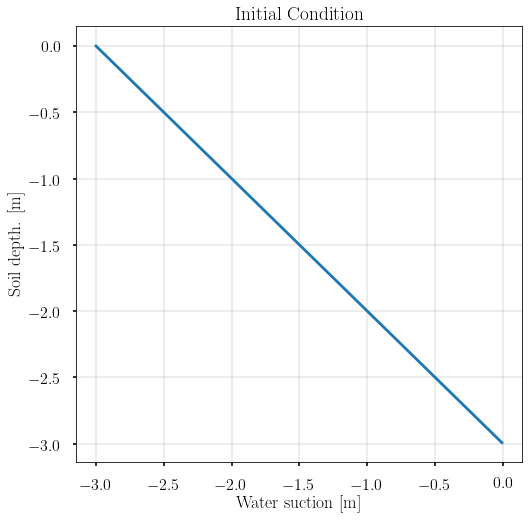

In [13]:
fig = plt.figure(figsize=(8,13/1.62))
ds.psiIC.plot(y='depth')
plt.xlabel('Water suction [m]')
plt.title('Initial Condition')
plt.grid(color='grey', linestyle='-', linewidth=0.3)

 ### Water suction $\psi$ among the soil depth in your simulation  

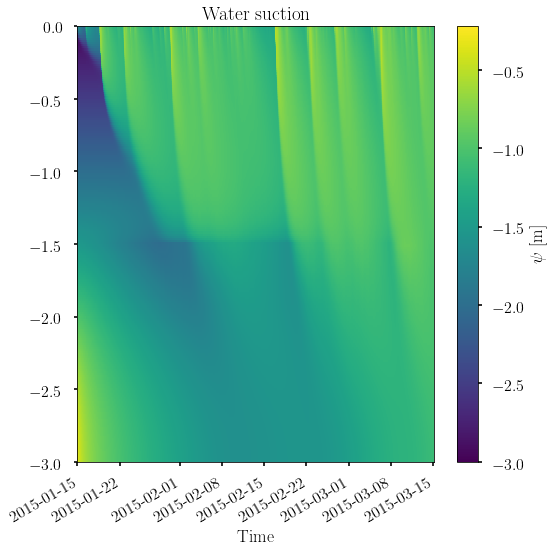

In [14]:
fig = plt.figure(figsize=(8,13/1.62))
ax = ds.psi.plot(y='depth', cmap='viridis',add_colorbar=False)
plt.xlabel('Time')
plt.ylabel('')
plt.title('Water suction')
cb = plt.colorbar(ax, orientation="vertical",pad=0.05) # horizontal
cb.set_label(label='$\psi$ [m]')

<br>

## Plot water content  $\theta$

Set the number of control volumes of your domain and the root depth 

In [15]:
n_volumes = 200
root_depth = -2
evaporation_layer_depth = -0.5

 ### Water content $\theta$ among the soil depth in your simulation  

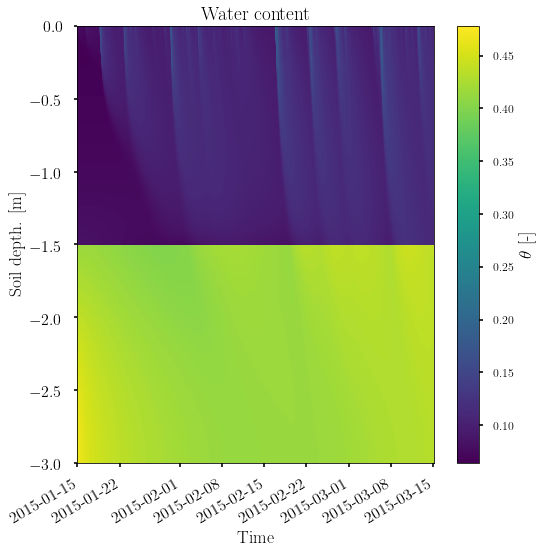

In [16]:
fig = plt.figure(figsize=(8,13/1.618))
ds.theta.where(ds.depth <0).plot(y='depth',add_colorbar=False)
ax = ds.theta.sel(depth=ds.depth.values[0:n_volumes]).plot(y='depth',add_colorbar=False)
plt.xlabel('Time')
plt.title('Water content')
cb = plt.colorbar(ax, orientation="vertical",pad=0.05) # horizontal
cb.set_label(label='$\\theta$ [-]')
cb.ax.tick_params(labelsize='large')

### Plot specifical depth
Define a vector of depth 'myDepth' you would plot 

In [17]:
myDepth = [-0.5,-1.5,-2]

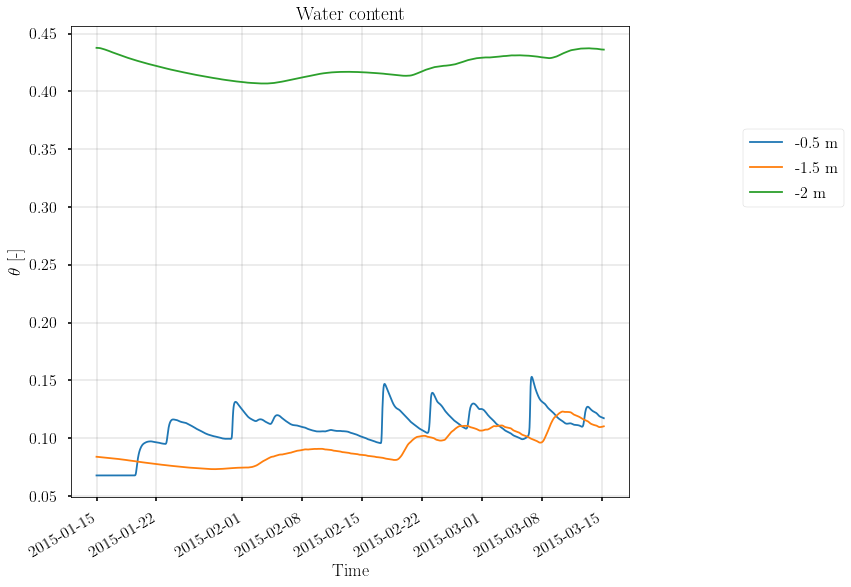

In [18]:
fig = plt.figure(figsize=(10,14/1.618))
for i in range (0,len(myDepth)):
    ds.theta.where(ds.depth<0).sel(depth=myDepth[i], method='nearest', time=ds.time.values[:]).plot(linewidth=1.8, label=str(myDepth[i])+' m')
plt.ylabel('$\\theta$ [-]')
plt.xlabel('Time')
plt.title('Water content')
plt.legend(bbox_to_anchor=(1.4,0.8))
plt.grid(color='grey', linestyle='-', linewidth=0.3)

### Plot specifical date
Define a vector of date 'myDate' you would plot 

In [23]:
myDate = ['2015-01-15 01:00:00','2015-01-30 02:00:00','2015-02-15 04:00:00','2015-03-15 01:00:00']

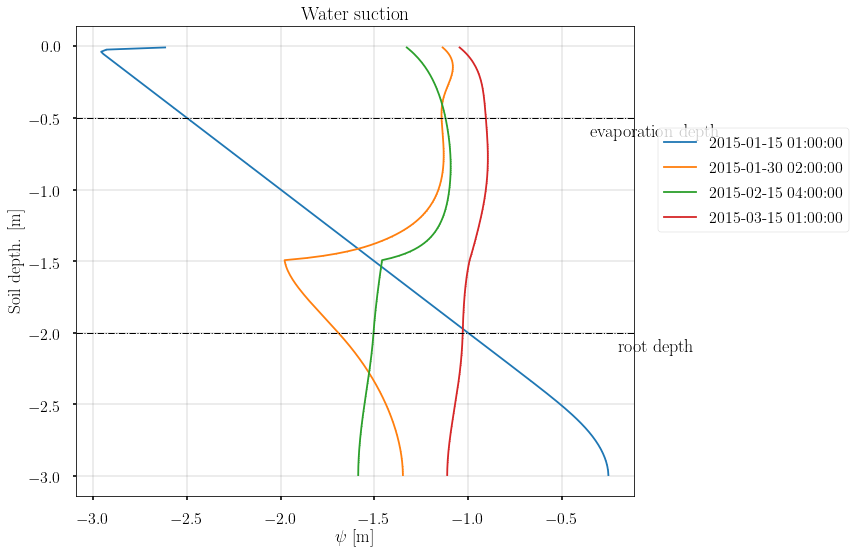

In [24]:
fig = plt.figure(figsize=(10,14/1.618))
for i in range (0,len(myDate)):
    ds.psi.sel(time=myDate[i], depth=ds.depth.values[0:n_volumes]).plot(y='depth', linewidth=1.8,marker='.',markersize=1, label=myDate[i])
plt.xlabel('$\\psi$ [m]')
plt.title('Water suction')
plt.legend(bbox_to_anchor=(1.4,0.8))
plt.axhline(y=root_depth, xmin=0, xmax=1,color='black',linewidth=1, linestyle='-.')
plt.text(-0, root_depth-0.10, 'root depth', horizontalalignment='center',verticalalignment='center', fontsize=18, bbox=dict(facecolor='white', alpha=0.))
plt.axhline(y=evaporation_layer_depth, xmin=0, xmax=1,color='black',linewidth=1,linestyle='-.')
plt.text(-0, evaporation_layer_depth-0.10, 'evaporation depth', horizontalalignment='center',verticalalignment='center', fontsize=18, bbox=dict(facecolor='white', alpha=0.))
plt.grid(color='grey', linestyle='-', linewidth=0.3)
#save figure
#plt.savefig('WaterSuction.png', dpi=300, bbox_inches = "tight")

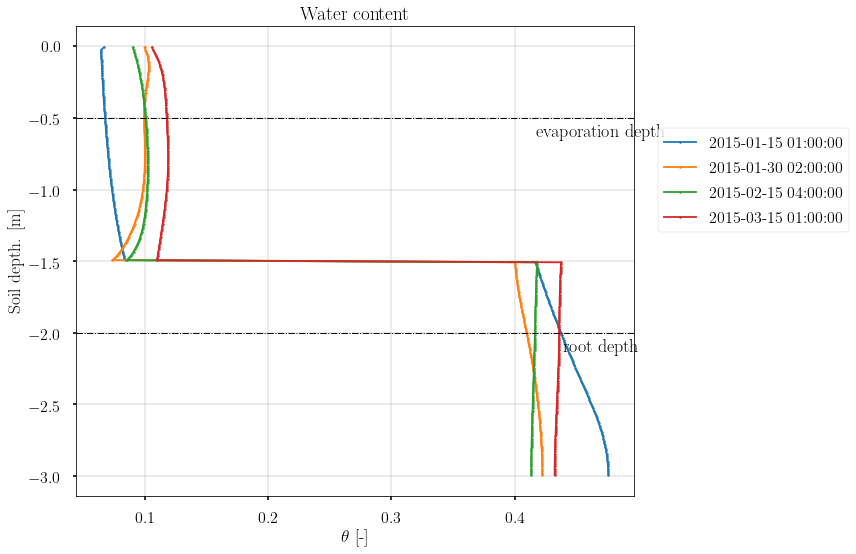

In [25]:
fig = plt.figure(figsize=(10,14/1.618))
for i in range (0,len(myDate)):
    ds.theta.sel(time=myDate[i], depth=ds.depth.values[0:n_volumes]).plot(y='depth', linewidth=1.8,marker='.',markersize=5, label=myDate[i])
plt.xlabel('$\\theta$ [-]')
plt.title('Water content')
plt.legend(bbox_to_anchor=(1.4,0.8))
plt.axhline(y=root_depth, xmin=0, xmax=1,color='black',linewidth=1, linestyle='-.')
plt.text(0.47, root_depth-0.10, 'root depth', horizontalalignment='center',verticalalignment='center', fontsize=18, bbox=dict(facecolor='white', alpha=0.))
plt.axhline(y=evaporation_layer_depth, xmin=0, xmax=1,color='black',linewidth=1,linestyle='-.')
plt.text(0.47, evaporation_layer_depth-0.10, 'evaporation depth', horizontalalignment='center',verticalalignment='center', fontsize=18, bbox=dict(facecolor='white', alpha=0.))
plt.grid(color='grey', linestyle='-', linewidth=0.3)
#save figure
#plt.savefig('WaterContent1_5.png', dpi=300, bbox_inches = "tight")

## Plot runoff and top-bottom flux 

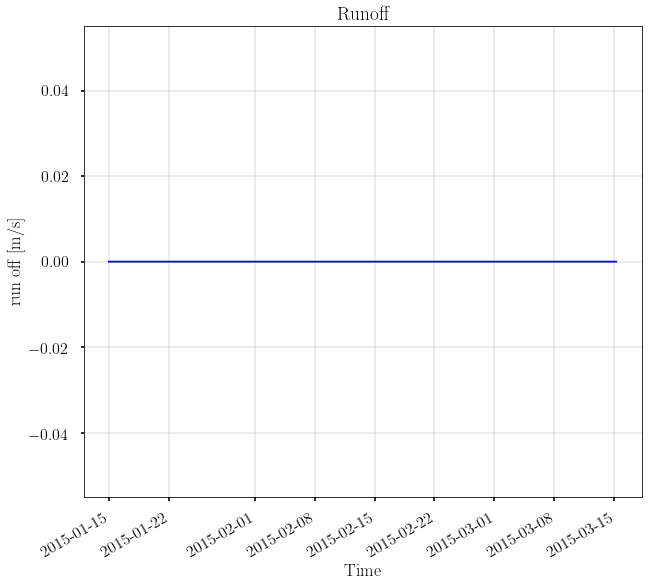

In [26]:
fig = plt.figure(figsize=(10,14/1.618))
ds.runOff.plot(linewidth=1.8,color='blue')
plt.title('Runoff')
plt.xlabel('Time')
plt.grid(color='grey', linestyle='-', linewidth=0.3)

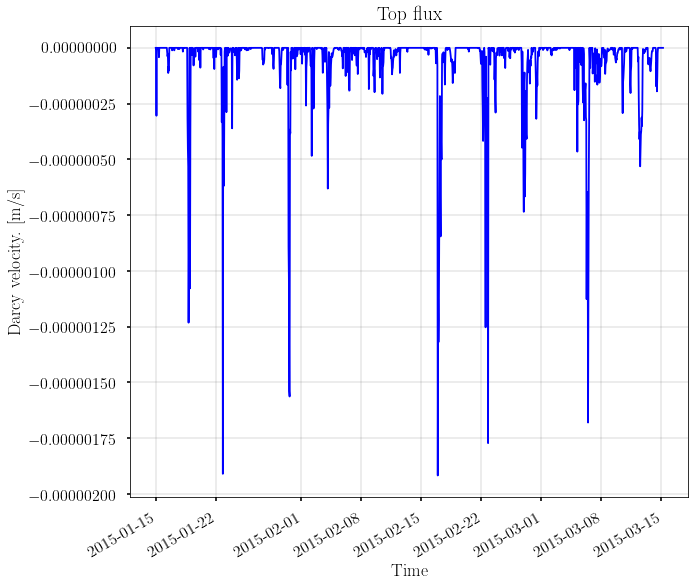

In [27]:
fig = plt.figure(figsize=(10,14/1.618))
ds.darcyVelocity.sel(dualDepth=[0], time=ds.time.values[:]).plot(linewidth=1.8,color='blue')
plt.title('Top flux')
plt.xlabel('Time')
plt.grid(color='grey', linestyle='-', linewidth=0.3)

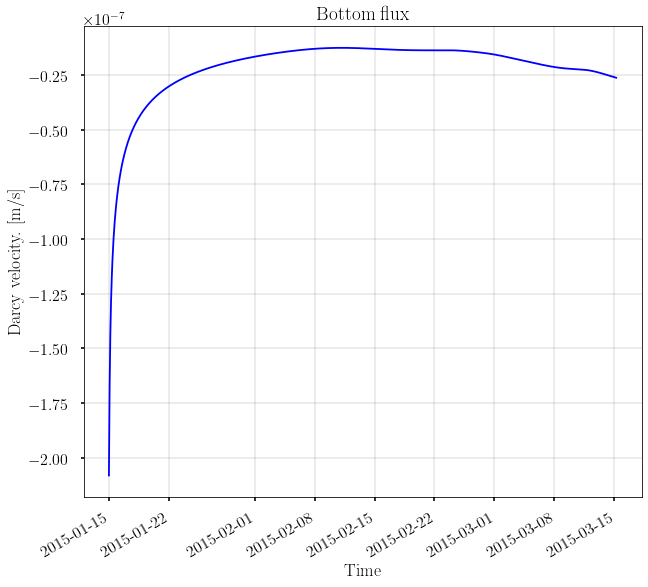

In [28]:
fig = plt.figure(figsize=(10,14/1.618))
ds.darcyVelocity.sel(dualDepth=[-3], time=ds.time.values[:]).plot(linewidth=1.8,color='blue')
plt.title('Bottom flux')
plt.xlabel('Time')
plt.grid(color='grey', linestyle='-', linewidth=0.3)

## Plot Error 

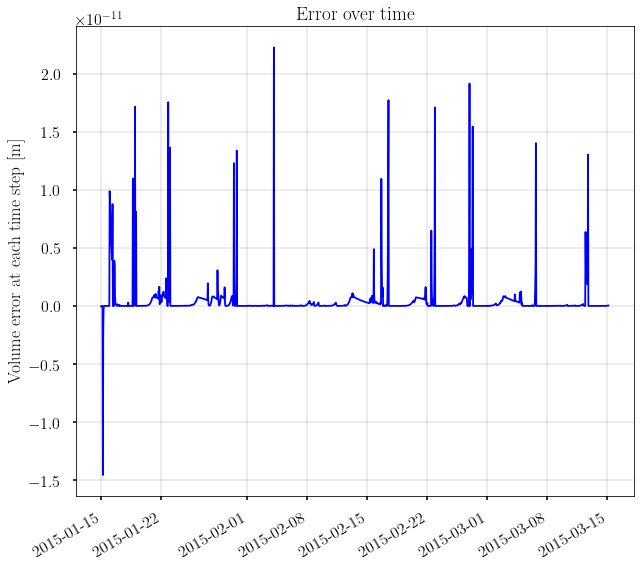

In [29]:
fig = plt.figure(figsize=(10,14/1.618))
ax = ds.error.plot(linewidth=1.8, color='blue')
plt.xlabel('')
plt.ylabel('Volume error at each time step [m]') 
plt.title('Error over time')
plt.grid(color='grey', linestyle='-', linewidth=0.3)

<br>

# Plot Evapotranspiration

In [30]:
os.chdir(oms_project_path+'/output/Cavone/1')
os.listdir()

['Evaporation_1_LysGEO_environmental_stress.csv',
 'Evaporation_1_LysGEO_potential.csv',
 'Evaporation_1_LysGEO_richards.csv',
 'Evaporation_1_LysGEO_total_stress.csv',
 'Evaporation_1_LysGEO_water_stress.csv',
 'EvapoTranspiration_1_LysGEO_environmental_stress.csv',
 'EvapoTranspiration_1_LysGEO_potential.csv',
 'EvapoTranspiration_1_LysGEO_richards.csv',
 'EvapoTranspiration_1_LysGEO_total_stress.csv',
 'EvapoTranspiration_1_LysGEO_water_stress.csv',
 'FluxEvaporation_1_LysGEO_environmental_stress.csv',
 'FluxEvaporation_1_LysGEO_potential.csv',
 'FluxEvaporation_1_LysGEO_richards.csv',
 'FluxEvaporation_1_LysGEO_total_stress.csv',
 'FluxEvaporation_1_LysGEO_water_stress.csv',
 'FluxEvapoTranspiration_1_LysGEO_environmental_stress.csv',
 'FluxEvapoTranspiration_1_LysGEO_potential.csv',
 'FluxEvapoTranspiration_1_LysGEO_richards.csv',
 'FluxEvapoTranspiration_1_LysGEO_total_stress.csv',
 'FluxEvapoTranspiration_1_LysGEO_water_stress.csv',
 'FluxTranspiration_1_LysGEO_environmental_str

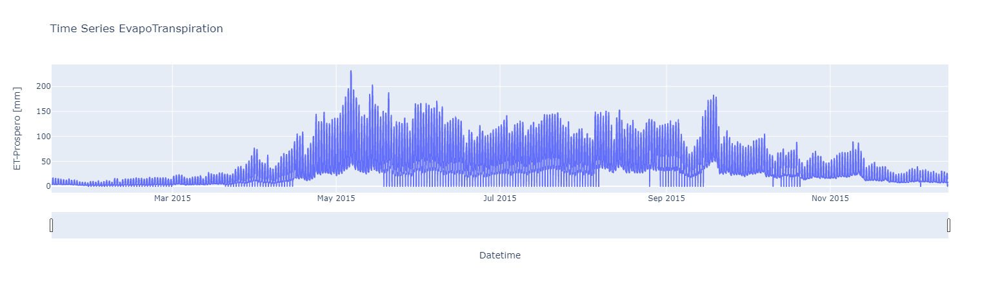

In [31]:
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd
df = pd.read_csv('FluxEvapoTranspiration_1_LysGEO_water_stress.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df.columns = ['Datetime','ET-Prospero [mm]']

fig = px.line(df, x='Datetime', y='ET-Prospero [mm]', title='Time Series EvapoTranspiration')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

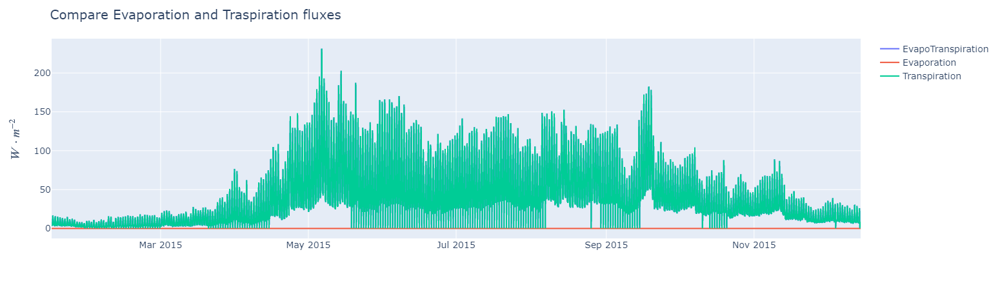

In [32]:
show_E_T('LysGEO_water_stress')

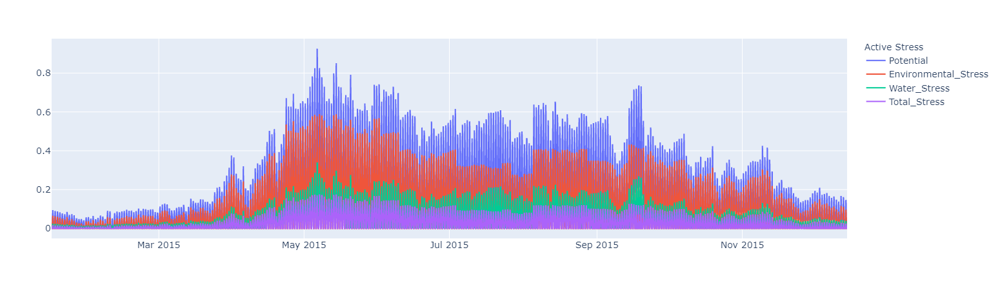

In [33]:
show_stress('Transpiration','LysGEO','1')

### **Laef Temperature**

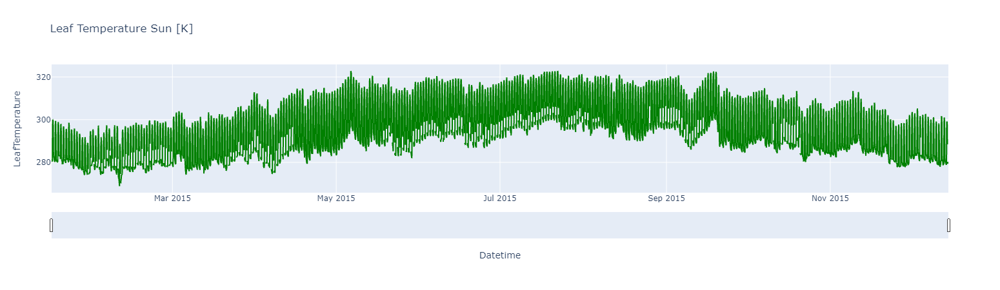

In [34]:
df = pd.read_csv('LeafTemperatureSun_1_LysGEO_water_stress.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df.columns = ['Datetime','LeafTemperature']

fig = px.line(df, x='Datetime', y='LeafTemperature', title='Leaf Temperature Sun [K]')

fig.update_traces(line_color='green')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

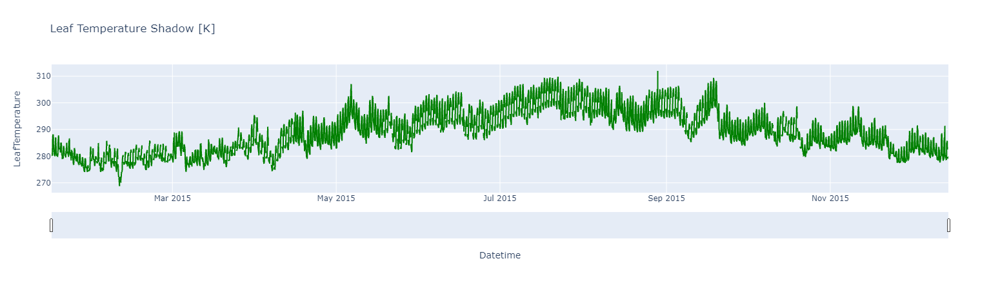

In [35]:
df = pd.read_csv('LeafTemperatureShadow_1_LysGEO_water_stress.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df.columns = ['Datetime','LeafTemperature']

fig = px.line(df, x='Datetime', y='LeafTemperature', title='Leaf Temperature Shadow [K]')

fig.update_traces(line_color='green')
fig.update_xaxes(rangeslider_visible=True)
fig.show()